In [219]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib import offsetbox
import numpy as np
import pandas as pd
import re
from mpl_toolkits.mplot3d import Axes3D

In [220]:
global dic
global count
count = 0
dic = {}

In [221]:
def plot_embedding3d(X, labels, num_color, cmp, title=None):
    x_min = np.min(X, 0)
    x_max = np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
    fig = plt.figure(figsize=(80,60))
    plt.style.use('dark_background')
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(*zip(*X), c=labels, cmap=plt.cm.get_cmap(cmp, num_color), s=150)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    if title is not None:
        plt.title(title)
        
def plot_embedding(X, labels, num_color, cmp, title=None):
    x_min = np.min(X, 0)
    x_max = np.max(X, 0)
    X = (X - x_min) / (x_max - x_min)
    fig = plt.figure(figsize=(80,60))
    plt.style.use('dark_background')
    plt.scatter(X[:, 0], X[:, 1], 
                c=labels,
                s=100, 
                cmap=plt.cm.get_cmap(cmp, num_color)
               )
                
    plt.colorbar(ticks=range(num_color))
    plt.xticks([])
    plt.yticks([])
    plt.show()
    if title is not None:
        plt.title(title)
        
def process(x):
    ans = set()
    for each in x[1:-1].split(','): 
        words = each.strip().strip('"').strip("'")
        m = re.match('(\w+)-', words)
        if m is not None:
            ans.add(m[1])
#         else:
#             ans.add(words)
    return list(ans)

def class_to_index(x):
    global dic
    global count
    if str(x) not in dic:
        dic[str(x)] = count
        count += 1
    return dic[str(x)]

In [222]:
# LABEL_COLUMN = "group"
LABEL_COLUMN = "merged_aspects"

In [223]:
df = pd.read_csv("whole_corpus_meta_top_5_viz.csv", sep='\t', index_col=None)
df[LABEL_COLUMN] = df[LABEL_COLUMN].apply(lambda x: [each.strip().strip("'") for each in x[1:-1].split(',')])

In [224]:
df[LABEL_COLUMN].value_counts()

[]                                         42235
[trusts]                                    2450
[errors]                                    2325
[delays]                                    2063
[costs]                                     1285
[access]                                     751
[errors, trusts]                             373
[delays, trusts]                             220
[costs, trusts]                              198
[delays, errors]                             189
[access, trusts]                             130
[access, delays]                             105
[costs, delays]                              103
[costs, errors]                               83
[access, errors]                              77
[access, costs]                               77
[delays, errors, trusts]                      54
[costs, errors, trusts]                       37
[costs, delays, trusts]                       32
[access, errors, trusts]                      31
[access, delays, tru

In [226]:
vectors = []
with open("whole_corpus_top_5_viz_cbow.txt", 'r') as f:
    for each in f.readlines():
        vectors.append([float(v) for v in each.strip().split(' ')])
f.close()
vectors = np.array(vectors)

In [227]:
# read data to extract desired label columns
keep_index = []
for index, each in enumerate(df.loc[:][LABEL_COLUMN]):
    if len(each) > 1:
        df = df.drop(index=index)
    else:
        keep_index.append(index)
df[LABEL_COLUMN+'_index'] = df[LABEL_COLUMN].apply(lambda x: class_to_index(x))

In [229]:
# # read fasttext vector
# vectors = []
# with open("../Aspect-based_Sentiment_Analysis/medical_sieve_training_set_cbow.txt", 'r') as f:
#     for each in f.readlines():
#         vectors.append([float(v) for v in each.strip().split(' ')])
# f.close()
# vectors = np.array(vectors)
vectors = vectors[keep_index]

In [233]:
# train TSNE and get embedding vcectors
X_embedded_2 = TSNE(n_components=2, random_state=0).fit_transform(vectors)
# X_embedded_3 = TSNE(n_components=3, random_state=0).fit_transform(vectors)

In [236]:
df['x'] = X_embedded_2[:,0]
df['y'] = X_embedded_2[:,1]

In [237]:
df.to_csv('whole_corpus_top_5_viz_tsne.csv')

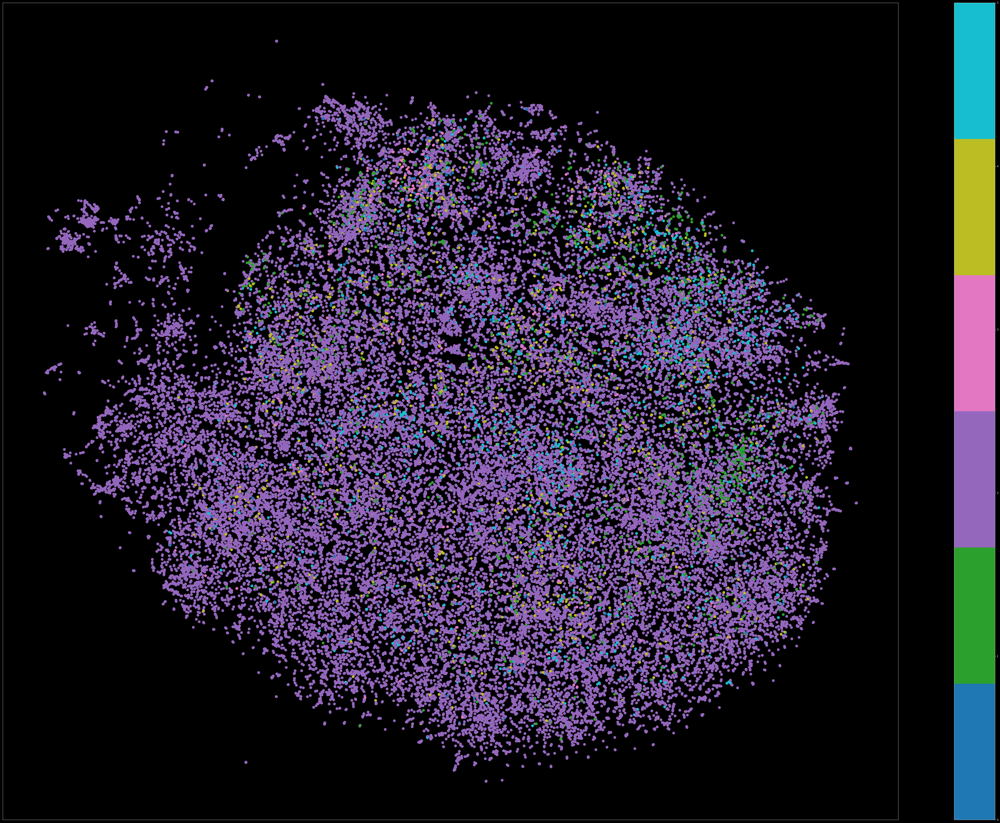

In [199]:
# plot fasttext vector in sentiment space and their labels as differnet colors in the diagram
plot_embedding(X_embedded_2, df[LABEL_COLUMN+'_index'], len(dic), "tab10")

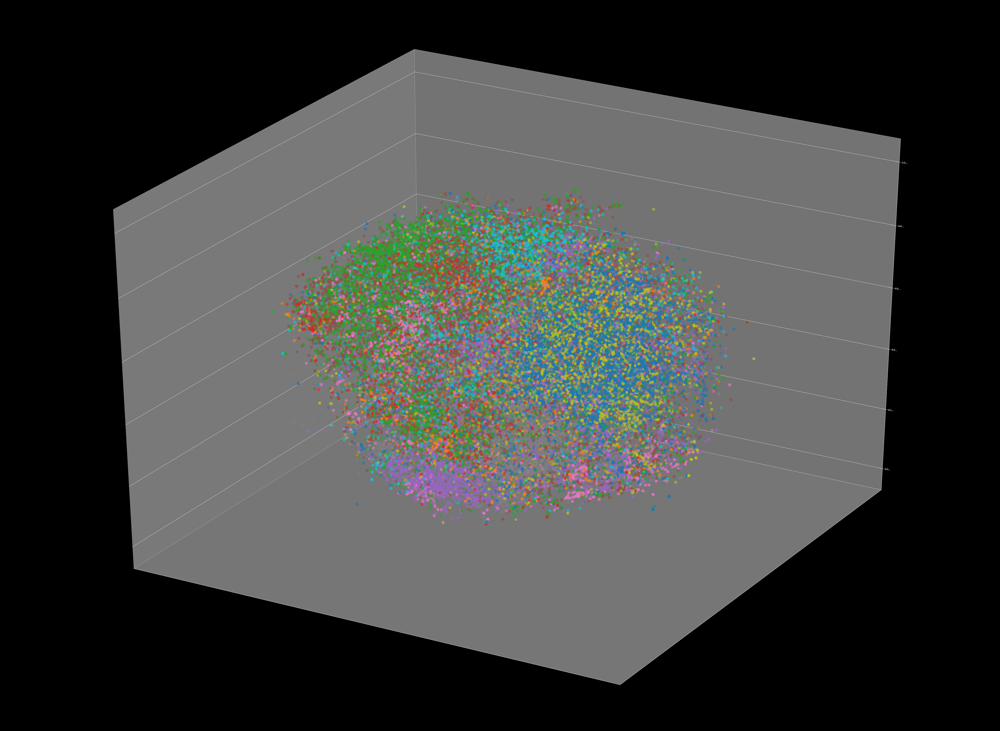

In [77]:
plot_embedding3d(X_embedded_3, df[LABEL_COLUMN+'_index'], len(dic), "tab10")